In [1]:
import pandas as pd
from glob import glob
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [53]:
df=pd.DataFrame()
filenames = glob("DataGovSG/*_rainfall.csv")
for filename in filenames:
    other_df = pd.read_csv(filename)
    other_df = other_df.rename(columns={"value": "rainfall"})
    other_df["timestamp_sgt"] = other_df["timestamp_sgt"].astype("datetime64[ns]")
    df = df.append(other_df,ignore_index=True)
another_df = df.set_index("station_id").sort_index()

In [64]:
non_zero = another_df[another_df["rainfall"]>0]
non_zero = non_zero.sort_values("timestamp_sgt",ascending=True).reset_index().set_index("timestamp_sgt",drop=False)
times = non_zero.index
non_zero = non_zero.set_index([times.year,times.month,times.day,times.hour])
non_zero.index.names = ["year","month","day","hour"]
#non_zero

In [65]:
non_zero = non_zero.groupby(["year","month","day","hour","station_id"]).sum()
non_zero

rainfall
year month day hour station_id          
2016 12    3   1    S06              0.8
                    S07              2.2
                    S102             0.4
                    S110             2.2
                    S113             1.0
                    S118             1.8
                    S119             0.8
                    S123             0.4
                    S29              0.2
                    S36              1.2
                    S43              2.0
                    S55              1.6
                    S61              1.4
                    S71              0.2
                    S78              3.2
                    S79              0.4
                    S81              1.2
                    S84              0.4
                    S88              1.4
                    S90              0.2
                    S94              0.8
                    S96              2.2
               2    S106             0.8
                    S117             0.2
                    S29              1.0
                    S77              0.2
                    S94              1.2
                    S96              0.2
               3    S90              0.2
               4    S102             0.8
...                                  ...
2017 4     29  7    S35              0.6
                    S43              0.2
                    S63              0.2
                    S71              0.2
                    S77              1.0
                    S79              1.0
                    S88              0.2
               8    S33              0.2
               9    S115             3.2
                    S117             0.4
                    S92              0.2
               10   S115             1.4
                    S116             3.0
                    S117             0.2
                    S63              0.2
                    S92              0.4
               11   S116             0.2
               12   S108             0.2
                    S92              0.2
               13   S77              0.2
               17   S55              0.8
                    S81              6.4
                    S900             0.2
           30  10   S81              0.2
               18   S104            23.6
               19   S100            24.0
                    S104             4.0
                    S112            34.8
                    S66             27.8
               20   S112             3.0

[17061 rows x 1 columns]

In [66]:
locations = pd.read_csv("StationLocations.csv")
locations=locations.rename(columns={"Lon (d)":"longitude","Lat (d)":"latitude"})
#locations

In [67]:
non_zero = non_zero.reset_index()
inner_df = pd.merge(non_zero,locations,how="left",on="station_id")

In [68]:
inner_df = inner_df.set_index(["year","month","day","hour"],drop=True)
inner_df

station_id  rainfall  longitude  latitude
year month day hour                                          
2016 12    3   1           S06       0.8  103.90070   1.35240
               1           S07       2.2  103.83340   1.34150
               1          S102       0.4  103.76800   1.18900
               1          S110       2.2  103.86970   1.36061
               1          S113       1.0  103.91074   1.30655
               1          S118       1.8  103.84610   1.29940
               1          S119       0.8  103.86660   1.30105
               1          S123       0.4  103.85770   1.32140
               1           S29       0.2  103.93500   1.38700
               1           S36       1.2  103.86570   1.33820
               1           S43       2.0  103.88780   1.33990
               1           S55       1.6  103.88600   1.38370
               1           S61       1.4  103.92170   1.32300
               1           S71       0.2  103.78150   1.29230
               1           S78       3.2  103.89067   1.30703
               1           S79       0.4  103.83720   1.30040
               1           S81       1.2  103.90920   1.40290
               1           S84       0.4  103.94440   1.34370
               1           S88       1.4  103.84820   1.34270
               1           S90       0.2  103.81910   1.31910
               1           S94       0.8  103.95280   1.36620
               1           S96       2.2  104.03070   1.31750
               2          S106       0.8  103.96730   1.41680
               2          S117       0.2  103.67900   1.25600
               2           S29       1.0  103.93500   1.38700
               2           S77       0.2  103.81250   1.29370
               2           S94       1.2  103.95280   1.36620
               2           S96       0.2  104.03070   1.31750
               3           S90       0.2  103.81910   1.31910
               4          S102       0.8  103.76800   1.18900
...                        ...       ...        ...       ...
2017 4     29  7           S35       0.6  103.75560   1.33290
               7           S43       0.2  103.88780   1.33990
               7           S63       0.2  103.70420   1.32750
               7           S71       0.2  103.78150   1.29230
               7           S77       1.0  103.81250   1.29370
               7           S79       1.0  103.83720   1.30040
               7           S88       0.2  103.84820   1.34270
               8           S33       0.2  103.71000   1.30810
               9          S115       3.2  103.61843   1.29377
               9          S117       0.4  103.67900   1.25600
               9           S92       0.2  103.78860   1.28410
               10         S115       1.4  103.61843   1.29377
               10         S116       3.0  103.75400   1.28100
               10         S117       0.2  103.67900   1.25600
               10          S63       0.2  103.70420   1.32750
               10          S92       0.4  103.78860   1.28410
               11         S116       0.2  103.75400   1.28100
               12         S108       0.2  103.87030   1.27990
               12          S92       0.2  103.78860   1.28410
               13          S77       0.2  103.81250   1.29370
               17          S55       0.8  103.88600   1.38370
               17          S81       6.4  103.90920   1.40290
               17         S900       0.2  103.86922   1.41284
           30  10          S81       0.2  103.90920   1.40290
               18         S104      23.6  103.78538   1.44387
               19         S100      24.0  103.74855   1.41720
               19         S104       4.0  103.78538   1.44387
               19         S112      34.8  103.70131   1.43854
               19          S66      27.8  103.73630   1.43870
               20         S112       3.0  103.70131   1.43854

[17061 rows x 4 columns]

In [69]:
indices = inner_df.index.unique().values

In [72]:
for index in indices:
    station = inner_df.loc[index]["station_id"]
    longitude = inner_df.loc[index]["longitude"]
    latitude = inner_df.loc[index]["latitude"]
    print(longitude)

year  month  day  hour
2016  12     3    1       103.90070
                  1       103.83340
                  1       103.76800
                  1       103.86970
                  1       103.91074
                  1       103.84610
                  1       103.86660
                  1       103.85770
                  1       103.93500
                  1       103.86570
                  1       103.88780
                  1       103.88600
                  1       103.92170
                  1       103.78150
                  1       103.89067
                  1       103.83720
                  1       103.90920
                  1       103.94440
                  1       103.84820
                  1       103.81910
                  1       103.95280
                  1       104.03070
Name: longitude, dtype: float64
year  month  day  hour
2016  12     3    2       103.9673
                  2       103.6790
                  2       103.9350
                  2      

Name: longitude, dtype: float64
year  month  day  hour
2016  12     6    14      103.9007
                  14      103.9826
                  14      103.8657
                  14      103.8878
                  14      103.9444
                  14      103.9528
Name: longitude, dtype: float64
year  month  day  hour
2016  12     6    15      103.9826
Name: longitude, dtype: float64
year  month  day  hour
2016  12     6    16      103.9673
                  16      103.9092
Name: longitude, dtype: float64
year  month  day  hour
2016  12     6    17      103.90070
                  17      103.96730
                  17      103.96250
                  17      103.86970
                  17      103.91074
                  17      103.82490
                  17      103.98260
                  17      103.93500
                  17      103.86570
                  17      103.88780
                  17      103.88600
                  17      103.92170
                  17      103.890

year  month  day  hour
2016  12     10   5       103.90070
                  5       103.83340
                  5       103.82710
                  5       103.74855
                  5       103.71340
                  5       103.96730
                  5       103.96250
                  5       103.87030
                  5       103.84920
                  5       103.69380
                  5       103.86970
                  5       103.70131
                  5       103.91074
                  5       103.73000
                  5       103.86660
                  5       103.72244
                  5       103.85770
                  5       103.98260
                  5       103.93500
                  5       103.86570
                  5       103.88780
                  5       103.68166
                  5       103.81060
                  5       103.77680
                  5       103.88600
                  5       103.92170
                  5       103.73630
     

year  month  day  hour
2016  12     14   10      103.8461
Name: longitude, dtype: float64
year  month  day  hour
2016  12     15   14      103.7363
Name: longitude, dtype: float64
year  month  day  hour
2016  12     16   13      103.91074
                  13      103.86660
                  13      103.92170
                  13      103.89067
                  13      103.94440
Name: longitude, dtype: float64
year  month  day  hour
2016  12     16   14      103.9007
                  14      103.9673
                  14      103.9625
                  14      103.9826
                  14      103.9350
                  14      103.9217
                  14      103.9444
                  14      103.9528
                  14      104.0307
Name: longitude, dtype: float64
year  month  day  hour
2016  12     16   15      103.9625
                  15      103.9217
                  15      104.0307
Name: longitude, dtype: float64
year  month  day  hour
2016  12     17   11      103.71

Name: longitude, dtype: float64
year  month  day  hour
2016  12     19   9       103.6938
Name: longitude, dtype: float64
year  month  day  hour
2016  12     19   10      103.7134
                  10      103.7886
Name: longitude, dtype: float64
year  month  day  hour
2016  12     19   12      103.6938
Name: longitude, dtype: float64
year  month  day  hour
2016  12     19   13      103.74855
                  13      103.70131
                  13      103.78962
                  13      103.80500
Name: longitude, dtype: float64
year  month  day  hour
2016  12     19   14      103.9092
                  14      103.8308
Name: longitude, dtype: float64
year  month  day  hour
2016  12     19   16      103.78962
                  16      103.90920
Name: longitude, dtype: float64
year  month  day  hour
2016  12     19   17      103.6938
Name: longitude, dtype: float64
year  month  day  hour
2016  12     19   20      103.90070
                  20      103.83340
                  20      1

year  month  day  hour
2016  12     22   23      103.9444
Name: longitude, dtype: float64
year  month  day  hour
2016  12     23   1       103.8271
                  1       103.9444
Name: longitude, dtype: float64
year  month  day  hour
2016  12     23   2       103.754
Name: longitude, dtype: float64
year  month  day  hour
2016  12     23   5       103.74855
                  5       103.76800
                  5       103.75400
                  5       103.67900
                  5       103.93500
                  5       103.94440
Name: longitude, dtype: float64
year  month  day  hour
2016  12     23   6       103.768
                  6       103.805
Name: longitude, dtype: float64
year  month  day  hour
2016  12     23   7       103.9673
Name: longitude, dtype: float64
year  month  day  hour
2016  12     23   10      103.9217
                  10      103.7603
Name: longitude, dtype: float64
year  month  day  hour
2016  12     23   11      103.9444
Name: longitude, dtype: float

year  month  day  hour
2016  12     25   8       103.89067
Name: longitude, dtype: float64
year  month  day  hour
2016  12     25   9       103.9007
Name: longitude, dtype: float64
year  month  day  hour
2016  12     25   10      103.8577
                  10      103.9092
                  10      103.9444
Name: longitude, dtype: float64
year  month  day  hour
2016  12     25   11      103.818
Name: longitude, dtype: float64
year  month  day  hour
2016  12     25   14      103.9826
                  14      103.9350
                  14      103.8106
                  14      103.7768
                  14      103.7603
                  14      103.9528
                  14      104.0307
Name: longitude, dtype: float64
year  month  day  hour
2016  12     25   15      103.90070
                  15      103.83340
                  15      103.82710
                  15      103.74855
                  15      103.78538
                  15      103.96730
                  15      103.8

year  month  day  hour
2016  12     28   7       103.90070
                  7       103.83340
                  7       103.82710
                  7       103.74855
                  7       103.71340
                  7       103.78538
                  7       103.96730
                  7       103.96250
                  7       103.87030
                  7       103.84920
                  7       103.69380
                  7       103.86970
                  7       103.70131
                  7       103.91074
                  7       103.73000
                  7       103.84610
                  7       103.86660
                  7       103.81800
                  7       103.72244
                  7       103.82490
                  7       103.85770
                  7       103.98260
                  7       103.93500
                  7       103.71000
                  7       103.75560
                  7       103.86570
                  7       103.78962
     

Name: longitude, dtype: float64
year  month  day  hour
2017  1      2    12      103.6938
                  12      103.6790
                  12      103.8180
                  12      103.7363
                  12      103.8125
Name: longitude, dtype: float64
year  month  day  hour
2017  1      2    13      103.61843
                  13      103.67900
                  13      103.71000
                  13      103.81060
                  13      103.66162
Name: longitude, dtype: float64
year  month  day  hour
2017  1      2    14      103.83340
                  14      103.74855
                  14      103.71340
                  14      103.73000
                  14      103.61843
                  14      103.67900
                  14      103.81800
                  14      103.72244
                  14      103.68166
                  14      103.76030
                  14      103.83720
                  14      103.66162
                  14      103.81910
Name: longit

year  month  day  hour
2017  1      4    6       103.90070
                  6       103.76800
                  6       103.96730
                  6       103.96250
                  6       103.87030
                  6       103.61843
                  6       103.75400
                  6       103.67900
                  6       103.81800
                  6       103.98260
                  6       103.93500
                  6       103.71000
                  6       103.90920
                  6       103.94440
                  6       103.86922
                  6       103.95280
                  6       104.03070
Name: longitude, dtype: float64
year  month  day  hour
2017  1      4    7       103.7300
                  7       103.7815
Name: longitude, dtype: float64
year  month  day  hour
2017  1      4    10      103.69380
                  10      103.68166
                  10      103.66162
Name: longitude, dtype: float64
year  month  day  hour
2017  1      4    11  

year  month  day  hour
2017  1      12   8       103.78538
Name: longitude, dtype: float64
year  month  day  hour
2017  1      12   9       103.8697
Name: longitude, dtype: float64
year  month  day  hour
2017  1      13   13      103.91074
                  13      103.81250
Name: longitude, dtype: float64
year  month  day  hour
2017  1      13   14      104.0307
Name: longitude, dtype: float64
year  month  day  hour
2017  1      13   15      103.91074
                  15      103.88780
                  15      103.92170
                  15      103.94440
Name: longitude, dtype: float64
year  month  day  hour
2017  1      13   16      103.9007
                  16      103.9625
                  16      103.9217
                  16      103.9444
                  16      104.0307
Name: longitude, dtype: float64
year  month  day  hour
2017  1      13   17      103.9007
                  17      104.0307
Name: longitude, dtype: float64
year  month  day  hour
2017  1      13   19     

year  month  day  hour
2017  1      19   8       103.89067
Name: longitude, dtype: float64
year  month  day  hour
2017  1      19   9       103.9007
                  9       103.8657
Name: longitude, dtype: float64
year  month  day  hour
2017  1      19   10      103.8191
Name: longitude, dtype: float64
year  month  day  hour
2017  1      19   11      103.6790
                  11      103.8308
Name: longitude, dtype: float64
year  month  day  hour
2017  1      19   14      103.9673
Name: longitude, dtype: float64
year  month  day  hour
2017  1      19   15      103.83340
                  15      103.82710
                  15      103.74855
                  15      103.71340
                  15      103.78538
                  15      103.84920
                  15      103.69380
                  15      103.86970
                  15      103.70131
                  15      103.91074
                  15      103.73000
                  15      103.84610
                  15    

year  month  day  hour
2017  1      21   16      103.90070
                  16      103.83340
                  16      103.82710
                  16      103.74855
                  16      103.71340
                  16      103.76800
                  16      103.96730
                  16      103.96250
                  16      103.87030
                  16      103.84920
                  16      103.69380
                  16      103.86970
                  16      103.70131
                  16      103.91074
                  16      103.73000
                  16      103.61843
                  16      103.75400
                  16      103.67900
                  16      103.84610
                  16      103.86660
                  16      103.81800
                  16      103.72244
                  16      103.85770
                  16      103.98260
                  16      103.93500
                  16      103.71000
                  16      103.75560
     

year  month  day  hour
2017  1      23   11      103.90070
                  11      103.83340
                  11      103.82710
                  11      103.74855
                  11      103.71340
                  11      103.76800
                  11      103.78538
                  11      103.96730
                  11      103.96250
                  11      103.87030
                  11      103.84920
                  11      103.69380
                  11      103.86970
                  11      103.70131
                  11      103.91074
                  11      103.73000
                  11      103.61843
                  11      103.75400
                  11      103.67900
                  11      103.84610
                  11      103.86660
                  11      103.81800
                  11      103.72244
                  11      103.85770
                  11      103.98260
                  11      103.93500
                  11      103.71000
     

year  month  day  hour
2017  1      24   11      103.90070
                  11      103.83340
                  11      103.82710
                  11      103.74855
                  11      103.71340
                  11      103.76800
                  11      103.78538
                  11      103.96730
                  11      103.96250
                  11      103.87030
                  11      103.84920
                  11      103.69380
                  11      103.86970
                  11      103.70131
                  11      103.91074
                  11      103.73000
                  11      103.61843
                  11      103.75400
                  11      103.67900
                  11      103.84610
                  11      103.86660
                  11      103.81800
                  11      103.72244
                  11      103.82490
                  11      103.85770
                  11      103.98260
                  11      103.93500
     

year  month  day  hour
2017  1      25   18      103.82710
                  18      103.74855
                  18      103.71340
                  18      103.76800
                  18      103.69380
                  18      103.70131
                  18      103.73000
                  18      103.61843
                  18      103.75400
                  18      103.67900
                  18      103.72244
                  18      103.71000
                  18      103.75560
                  18      103.86570
                  18      103.78962
                  18      103.68166
                  18      103.77680
                  18      103.70420
                  18      103.76030
                  18      103.73630
                  18      103.80500
                  18      103.78150
Name: longitude, dtype: float64
year  month  day  hour
2017  1      25   19      103.69380
                  19      103.61843
                  19      103.67900
                  19  

Name: longitude, dtype: float64
year  month  day  hour
2017  1      29   0       103.9673
Name: longitude, dtype: float64
year  month  day  hour
2017  1      29   2       103.9826
Name: longitude, dtype: float64
year  month  day  hour
2017  1      29   3       103.90070
                  3       103.83340
                  3       103.71340
                  3       103.96730
                  3       103.86970
                  3       103.91074
                  3       103.82490
                  3       103.85770
                  3       103.98260
                  3       103.93500
                  3       103.86570
                  3       103.78962
                  3       103.88600
                  3       103.92170
                  3       103.80500
                  3       103.89067
                  3       103.90920
                  3       103.94440
                  3       103.86922
                  3       103.95280
                  3       104.03070
Name: lon

year  month  day  hour
2017  2      1    17      103.61843
Name: longitude, dtype: float64
year  month  day  hour
2017  2      1    18      103.61843
Name: longitude, dtype: float64
year  month  day  hour
2017  2      2    6       103.679
Name: longitude, dtype: float64
year  month  day  hour
2017  2      2    7       103.61843
                  7       103.67900
Name: longitude, dtype: float64
year  month  day  hour
2017  2      2    17      103.78538
                  17      103.78962
                  17      103.83080
Name: longitude, dtype: float64
year  month  day  hour
2017  2      2    18      103.90070
                  18      103.83340
                  18      103.82710
                  18      103.84920
                  18      103.91074
                  18      103.61843
                  18      103.82490
                  18      103.98260
                  18      103.93500
                  18      103.78962
                  18      103.88780
                  18

year  month  day  hour
2017  2      4    15      103.82710
                  15      103.74855
                  15      103.96250
                  15      103.84920
                  15      103.69380
                  15      103.86970
                  15      103.70131
                  15      103.91074
                  15      103.73000
                  15      103.75400
                  15      103.86660
                  15      103.81800
                  15      103.72244
                  15      103.82490
                  15      103.85770
                  15      103.71000
                  15      103.88780
                  15      103.77680
                  15      103.88600
                  15      103.92170
                  15      103.76030
                  15      103.73630
                  15      103.80500
                  15      103.78150
                  15      103.81250
                  15      103.89067
                  15      103.83720
     

year  month  day  hour
2017  2      8    15      103.90070
                  15      103.96250
                  15      103.84610
                  15      103.86660
                  15      103.85770
                  15      103.92170
                  15      103.89067
                  15      103.83720
                  15      104.03070
Name: longitude, dtype: float64
year  month  day  hour
2017  2      8    16      103.90070
                  16      103.74855
                  16      103.78538
                  16      103.96730
                  16      103.96250
                  16      103.84920
                  16      103.73000
                  16      103.84610
                  16      103.86660
                  16      103.81800
                  16      103.98260
                  16      103.93500
                  16      103.78962
                  16      103.81060
                  16      103.88600
                  16      103.76030
                  16  

year  month  day  hour
2017  2      12   16      103.90070
                  16      103.83340
                  16      103.82710
                  16      103.74855
                  16      103.71340
                  16      103.76800
                  16      103.78538
                  16      103.87030
                  16      103.84920
                  16      103.69380
                  16      103.91074
                  16      103.73000
                  16      103.61843
                  16      103.75400
                  16      103.67900
                  16      103.84610
                  16      103.86660
                  16      103.81800
                  16      103.72244
                  16      103.85770
                  16      103.71000
                  16      103.75560
                  16      103.86570
                  16      103.78962
                  16      103.88780
                  16      103.68166
                  16      103.81060
     

year  month  day  hour
2017  2      14   12      103.9007
                  12      103.8703
                  12      103.8666
                  12      103.8878
                  12      103.7363
                  12      104.0307
Name: longitude, dtype: float64
year  month  day  hour
2017  2      14   13      103.83340
                  13      103.78538
                  13      103.87030
                  13      103.69380
                  13      103.91074
                  13      103.86660
                  13      103.81800
                  13      103.98260
                  13      103.93500
                  13      103.81060
                  13      103.92170
                  13      103.78150
                  13      103.81250
                  13      103.89067
                  13      103.94440
                  13      103.81910
                  13      103.78860
                  13      103.95280
                  13      104.03070
Name: longitude, dtype: floa

year  month  day  hour
2017  2      15   15      103.9625
                  15      103.8703
                  15      103.8697
                  15      103.8461
                  15      103.8666
                  15      103.8577
                  15      103.9826
                  15      103.8657
                  15      103.8860
                  15      103.8279
                  15      103.8125
                  15      103.8372
                  15      103.8482
Name: longitude, dtype: float64
year  month  day  hour
2017  2      15   16      103.78538
                  16      103.61843
                  16      103.81060
Name: longitude, dtype: float64
year  month  day  hour
2017  2      15   18      103.96250
                  18      103.61843
Name: longitude, dtype: float64
year  month  day  hour
2017  2      16   1       103.8492
                  1       104.0307
Name: longitude, dtype: float64
year  month  day  hour
2017  2      16   2       103.8271
Name: longitude, 

year  month  day  hour
2017  2      24   18      103.90070
                  18      103.83340
                  18      103.82710
                  18      103.74855
                  18      103.71340
                  18      103.78538
                  18      103.96730
                  18      103.96250
                  18      103.87030
                  18      103.84920
                  18      103.69380
                  18      103.86970
                  18      103.70131
                  18      103.91074
                  18      103.73000
                  18      103.84610
                  18      103.86660
                  18      103.81800
                  18      103.72244
                  18      103.82490
                  18      103.85770
                  18      103.98260
                  18      103.93500
                  18      103.71000
                  18      103.75560
                  18      103.86570
                  18      103.78962
     

year  month  day  hour
2017  2      27   1       103.71
Name: longitude, dtype: float64
year  month  day  hour
2017  2      27   2       103.7886
Name: longitude, dtype: float64
year  month  day  hour
2017  2      27   4       103.71
Name: longitude, dtype: float64
year  month  day  hour
2017  2      27   7       103.71
Name: longitude, dtype: float64
year  month  day  hour
2017  2      27   9       103.71
Name: longitude, dtype: float64
year  month  day  hour
2017  2      27   10      103.72244
                  10      103.75560
                  10      103.68166
Name: longitude, dtype: float64
year  month  day  hour
2017  2      27   11      103.71
Name: longitude, dtype: float64
year  month  day  hour
2017  2      27   12      103.82710
                  12      103.87030
                  12      103.84920
                  12      103.82490
                  12      103.75560
                  12      103.78962
                  12      103.81060
                  12      103.77

Name: longitude, dtype: float64
year  month  day  hour
2017  3      1    6       103.90070
                  6       103.83340
                  6       103.82710
                  6       103.74855
                  6       103.71340
                  6       103.76800
                  6       103.78538
                  6       103.96730
                  6       103.96250
                  6       103.87030
                  6       103.84920
                  6       103.69380
                  6       103.86970
                  6       103.70131
                  6       103.91074
                  6       103.73000
                  6       103.61843
                  6       103.75400
                  6       103.84610
                  6       103.86660
                  6       103.81800
                  6       103.72244
                  6       103.82490
                  6       103.85770
                  6       103.98260
                  6       103.93500
         

Name: longitude, dtype: float64
year  month  day  hour
2017  3      3    12      103.83340
                  12      103.82710
                  12      103.74855
                  12      103.71340
                  12      103.76800
                  12      103.78538
                  12      103.84920
                  12      103.69380
                  12      103.86970
                  12      103.73000
                  12      103.61843
                  12      103.75400
                  12      103.84610
                  12      103.81800
                  12      103.72244
                  12      103.82490
                  12      103.85770
                  12      103.75560
                  12      103.78962
                  12      103.68166
                  12      103.81060
                  12      103.77680
                  12      103.88600
                  12      103.70420
                  12      103.76030
                  12      103.73630
         

year  month  day  hour
2017  3      4    20      103.8106
Name: longitude, dtype: float64
year  month  day  hour
2017  3      4    22      103.71
Name: longitude, dtype: float64
year  month  day  hour
2017  3      5    9       103.86970
                  9       103.72244
Name: longitude, dtype: float64
year  month  day  hour
2017  3      5    12      103.8878
Name: longitude, dtype: float64
year  month  day  hour
2017  3      5    14      103.90070
                  14      103.83340
                  14      103.76800
                  14      103.96250
                  14      103.87030
                  14      103.84920
                  14      103.86970
                  14      103.91074
                  14      103.73000
                  14      103.84610
                  14      103.86660
                  14      103.81800
                  14      103.82490
                  14      103.85770
                  14      103.86570
                  14      103.88780
      

Name: longitude, dtype: float64
year  month  day  hour
2017  3      7    21      103.70131
Name: longitude, dtype: float64
year  month  day  hour
2017  3      8    0       103.8271
Name: longitude, dtype: float64
year  month  day  hour
2017  3      8    2       103.78538
Name: longitude, dtype: float64
year  month  day  hour
2017  3      8    15      103.7815
Name: longitude, dtype: float64
year  month  day  hour
2017  3      8    16      103.69380
                  16      103.70131
                  16      103.72244
                  16      103.75560
Name: longitude, dtype: float64
year  month  day  hour
2017  3      8    17      103.74855
                  17      103.71340
                  17      103.69380
                  17      103.73000
                  17      103.72244
                  17      103.71000
                  17      103.75560
                  17      103.68166
                  17      103.70420
                  17      103.73630
                  17    

year  month  day  hour
2017  3      12   8       103.9007
                  8       103.8878
                  8       103.7815
Name: longitude, dtype: float64
year  month  day  hour
2017  3      12   9       104.0307
Name: longitude, dtype: float64
year  month  day  hour
2017  3      12   10      104.0307
Name: longitude, dtype: float64
year  month  day  hour
2017  3      12   11      103.78538
                  11      103.96730
                  11      103.87030
Name: longitude, dtype: float64
year  month  day  hour
2017  3      12   12      103.70131
                  12      103.61843
Name: longitude, dtype: float64
year  month  day  hour
2017  3      13   16      103.8697
                  16      103.8860
Name: longitude, dtype: float64
year  month  day  hour
2017  3      13   17      103.90070
                  17      103.86970
                  17      103.86570
                  17      103.78962
                  17      103.88780
                  17      103.88600
      

Name: longitude, dtype: float64
year  month  day  hour
2017  3      18   17      103.74855
                  17      103.71340
                  17      103.69380
                  17      103.70131
                  17      103.73000
                  17      103.72244
                  17      103.71000
                  17      103.75560
                  17      103.68166
                  17      103.70420
                  17      103.76030
                  17      103.73630
Name: longitude, dtype: float64
year  month  day  hour
2017  3      18   18      103.74855
                  18      103.71340
                  18      103.69380
                  18      103.70131
                  18      103.73000
                  18      103.67900
                  18      103.72244
                  18      103.71000
                  18      103.75560
                  18      103.70420
Name: longitude, dtype: float64
year  month  day  hour
2017  3      18   19      103.6938
        

year  month  day  hour
2017  3      23   14      103.935
Name: longitude, dtype: float64
year  month  day  hour
2017  3      24   9       103.82710
                  9       103.87030
                  9       103.84920
                  9       103.73000
                  9       103.84610
                  9       103.86660
                  9       103.72244
                  9       103.71000
                  9       103.76030
                  9       103.83720
Name: longitude, dtype: float64
year  month  day  hour
2017  3      24   10      103.78538
                  10      103.96250
                  10      103.87030
                  10      103.84920
                  10      103.73000
                  10      103.84610
                  10      103.86660
                  10      103.72244
                  10      103.76030
                  10      103.83720
Name: longitude, dtype: float64
year  month  day  hour
2017  3      24   12      103.72244
Name: longitude, dtype

year  month  day  hour
2017  3      31   10      103.74855
                  10      103.98260
                  10      103.68166
Name: longitude, dtype: float64
year  month  day  hour
2017  3      31   11      103.70131
                  11      103.71000
                  11      103.81250
Name: longitude, dtype: float64
year  month  day  hour
2017  3      31   14      103.8271
                  14      103.7300
                  14      103.8050
Name: longitude, dtype: float64
year  month  day  hour
2017  3      31   15      103.83340
                  15      103.82710
                  15      103.84920
                  15      103.86970
                  15      103.91074
                  15      103.85770
                  15      103.93500
                  15      103.75560
                  15      103.86570
                  15      103.88780
                  15      103.81060
                  15      103.77680
                  15      103.88600
                  15   

year  month  day  hour
2017  4      3    5       103.91074
                  5       103.67900
                  5       103.71000
                  5       103.75560
                  5       103.77680
                  5       103.92170
                  5       103.89067
                  5       103.66162
                  5       103.86922
                  5       104.03070
Name: longitude, dtype: float64
year  month  day  hour
2017  4      3    6       103.83340
                  6       103.82710
                  6       103.96250
                  6       103.87030
                  6       103.84920
                  6       103.86970
                  6       103.91074
                  6       103.75400
                  6       103.67900
                  6       103.84610
                  6       103.86660
                  6       103.81800
                  6       103.85770
                  6       103.75560
                  6       103.86570
                  6   

year  month  day  hour
2017  4      7    1       103.71340
                  1       103.96730
                  1       103.87030
                  1       103.69380
                  1       103.73000
                  1       103.61843
                  1       103.75400
                  1       103.67900
                  1       103.84610
                  1       103.86660
                  1       103.81800
                  1       103.72244
                  1       103.71000
                  1       103.75560
                  1       103.68166
                  1       103.77680
                  1       103.70420
                  1       103.80500
                  1       103.78150
                  1       103.81250
                  1       103.83720
                  1       103.66162
                  1       103.81910
                  1       103.78860
Name: longitude, dtype: float64
year  month  day  hour
2017  4      7    2       103.83340
                  2   

year  month  day  hour
2017  4      9    17      103.8125
Name: longitude, dtype: float64
year  month  day  hour
2017  4      10   5       103.754
                  5       103.679
Name: longitude, dtype: float64
year  month  day  hour
2017  4      10   6       103.61843
                  6       103.75400
                  6       103.67900
                  6       103.71000
                  6       103.68166
                  6       103.78150
                  6       103.66162
                  6       103.78860
Name: longitude, dtype: float64
year  month  day  hour
2017  4      10   7       103.71340
                  7       103.76800
                  7       103.69380
                  7       103.61843
                  7       103.75400
                  7       103.67900
                  7       103.72244
                  7       103.71000
                  7       103.75560
                  7       103.68166
                  7       103.76030
                  7      

year  month  day  hour
2017  4      13   19      103.74855
                  19      103.84920
                  19      103.73000
                  19      103.61843
                  19      103.67900
                  19      103.71000
                  19      103.68166
                  19      103.84820
                  19      103.66162
Name: longitude, dtype: float64
year  month  day  hour
2017  4      13   20      103.74855
                  20      103.71340
                  20      103.69380
                  20      103.73000
                  20      103.75400
                  20      103.67900
                  20      103.81800
                  20      103.85770
                  20      103.71000
                  20      103.75560
                  20      103.68166
                  20      103.81060
                  20      103.77680
                  20      103.76030
                  20      103.81250
                  20      103.66162
                  20  

Name: longitude, dtype: float64
year  month  day  hour
2017  4      15   18      103.71340
                  18      103.84920
                  18      103.69380
                  18      103.73000
                  18      103.61843
                  18      103.75400
                  18      103.68166
                  18      103.66162
Name: longitude, dtype: float64
year  month  day  hour
2017  4      15   19      103.69380
                  19      103.61843
                  19      103.68166
                  19      103.66162
Name: longitude, dtype: float64
year  month  day  hour
2017  4      15   20      103.61843
                  20      103.86660
Name: longitude, dtype: float64
year  month  day  hour
2017  4      15   23      103.7042
Name: longitude, dtype: float64
year  month  day  hour
2017  4      16   1       103.70131
                  1       103.81060
Name: longitude, dtype: float64
year  month  day  hour
2017  4      16   4       103.818
Name: longitude, dtype: f

Name: longitude, dtype: float64
year  month  day  hour
2017  4      20   1       103.70131
Name: longitude, dtype: float64
year  month  day  hour
2017  4      20   12      103.84920
                  12      103.70131
                  12      103.88600
                  12      103.86922
Name: longitude, dtype: float64
year  month  day  hour
2017  4      20   13      103.83340
                  13      103.74855
                  13      103.78538
                  13      103.84920
                  13      103.69380
                  13      103.73000
                  13      103.72244
                  13      103.82490
                  13      103.78962
                  13      103.81060
                  13      103.76030
                  13      103.86922
Name: longitude, dtype: float64
year  month  day  hour
2017  4      20   14      103.83340
                  14      103.74855
                  14      103.71340
                  14      103.96730
                  14    

Name: longitude, dtype: float64
year  month  day  hour
2017  4      24   10      103.73
Name: longitude, dtype: float64
year  month  day  hour
2017  4      24   11      103.82710
                  11      103.78538
                  11      103.82490
                  11      103.78962
Name: longitude, dtype: float64
year  month  day  hour
2017  4      24   12      103.82710
                  12      103.74855
                  12      103.78538
                  12      103.84920
                  12      103.82490
                  12      103.78962
Name: longitude, dtype: float64
year  month  day  hour
2017  4      24   13      103.74855
                  13      103.78538
                  13      103.84920
                  13      103.70131
                  13      103.73000
                  13      103.82490
                  13      103.78962
                  13      103.76030
                  13      103.86922
Name: longitude, dtype: float64
year  month  day  hour
2017  4 

year  month  day  hour
2017  4      28   3       103.83340
                  3       103.82710
                  3       103.74855
                  3       103.71340
                  3       103.78538
                  3       103.96730
                  3       103.84920
                  3       103.69380
                  3       103.70131
                  3       103.73000
                  3       103.61843
                  3       103.75400
                  3       103.67900
                  3       103.86660
                  3       103.81800
                  3       103.82490
                  3       103.98260
                  3       103.93500
                  3       103.71000
                  3       103.75560
                  3       103.78962
                  3       103.88780
                  3       103.81060
                  3       103.77680
                  3       103.88600
                  3       103.76030
                  3       103.73630
     

In [93]:
number = inner_df.groupby(["year","month","day","hour"]).nunique()["station_id"]
number=number[number==1]
one_station = list(number.index)
mult_stations = inner_df.drop(one_station)
mult_stations.head()

station_id  rainfall  longitude  latitude
year month day hour                                          
2016 12    3   1           S06       0.8  103.90070   1.35240
               1           S07       2.2  103.83340   1.34150
               1          S102       0.4  103.76800   1.18900
               1          S110       2.2  103.86970   1.36061
               1          S113       1.0  103.91074   1.30655

In [112]:
indices = mult_stations.index.unique().values

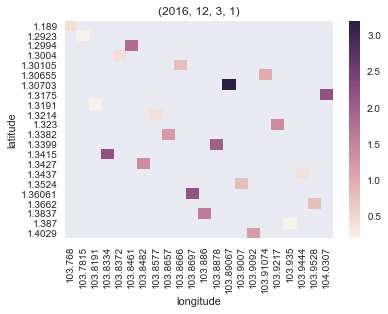

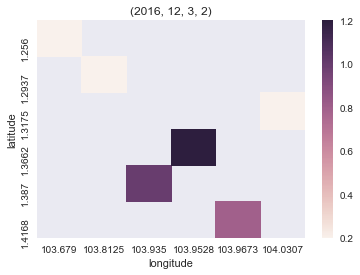

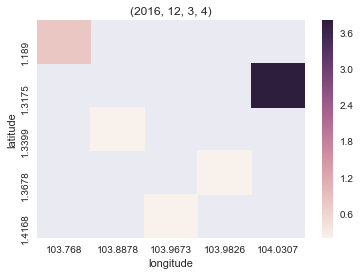

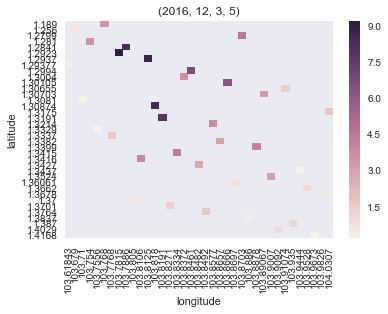

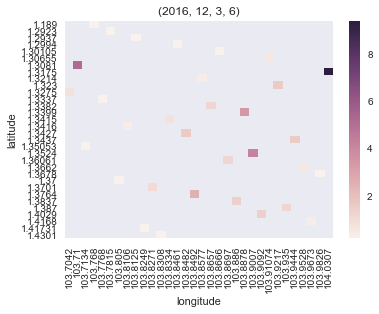

...

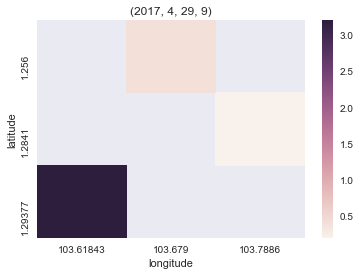

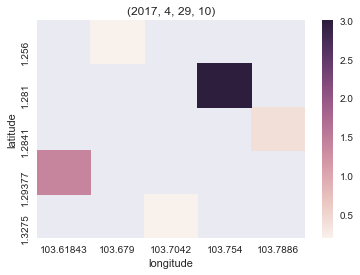

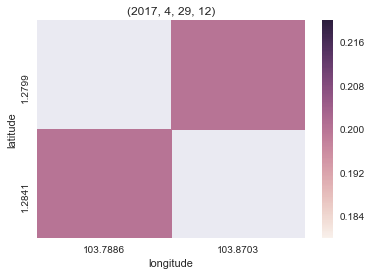

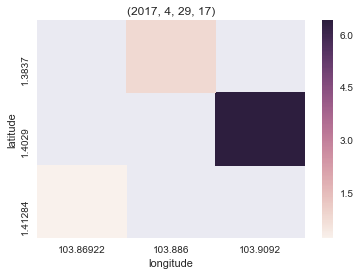

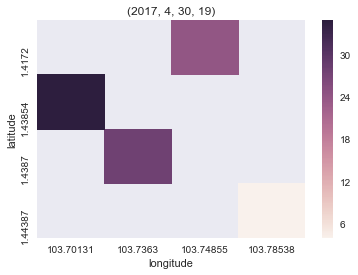

In [121]:
#Total rainfall by station for each hour (shows precipitation intensity)
for index in indices:
    new_df = mult_stations.loc[index]
    new_df.set_index("station_id",inplace=True,drop=True)
    new_df = new_df.reset_index(drop=True)
    new_df = new_df.pivot(index="latitude",columns="longitude",values="rainfall")
    #print(new_df.head())
    ax=plt.axes()
    sns.heatmap(new_df,ax=ax)
    ax.set_title(index)
    plt.show()

In [122]:
newnon_zero = another_df[another_df["rainfall"]>0]
newnon_zero = newnon_zero.sort_values("timestamp_sgt",ascending=True).reset_index().set_index("timestamp_sgt",drop=False)
newnon_zero.head()

,station_id,rainfall,timestamp_sgt
timestamp_sgt,,,
2016-12-03 01:04:59,S90,0.2,2016-12-03 01:04:59
2016-12-03 01:04:59,S07,0.8,2016-12-03 01:04:59
2016-12-03 01:09:59,S07,0.2,2016-12-03 01:09:59
2016-12-03 01:09:59,S71,0.2,2016-12-03 01:09:59
2016-12-03 01:14:59,S88,0.2,2016-12-03 01:14:59
